In [3]:
import pandas as pd

df = pd.read_csv("GlobalWeatherRepository.csv")
print("Data Loaded Successfully!")
print("First 5 rows:")
print(df.head())

Data Loaded Successfully!
First 5 rows:
       country     location_name  latitude  longitude        timezone  \
0  Afghanistan             Kabul     34.52      69.18      Asia/Kabul   
1      Albania            Tirana     41.33      19.82   Europe/Tirane   
2      Algeria           Algiers     36.76       3.05  Africa/Algiers   
3      Andorra  Andorra La Vella     42.50       1.52  Europe/Andorra   
4       Angola            Luanda     -8.84      13.23   Africa/Luanda   

   last_updated_epoch      last_updated  temperature_celsius  \
0          1715849100  2024-05-16 13:15                 26.6   
1          1715849100  2024-05-16 10:45                 19.0   
2          1715849100  2024-05-16 09:45                 23.0   
3          1715849100  2024-05-16 10:45                  6.3   
4          1715849100  2024-05-16 09:45                 26.0   

   temperature_fahrenheit condition_text  ...  air_quality_PM2.5  \
0                    79.8  Partly Cloudy  ...                8.4   


In [4]:
import numpy as np
from sklearn.linear_model import LinearRegression

print("Missing values before handling:")
print(df.isnull().sum())

for col in df.select_dtypes(include=[np.number]).columns:
    missing_rows = df[df[col].isnull()]
    if not missing_rows.empty:
        train_data = df.dropna(subset=[col])
        model = LinearRegression()
        model.fit(train_data.drop(columns=[col]), train_data[col])
        df.loc[df[col].isnull(), col] = model.predict(missing_rows.drop(columns=[col]))

print("Missing values after handling:")
print(df.isnull().sum())

Missing values before handling:
country                         0
location_name                   0
latitude                        0
longitude                       0
timezone                        0
last_updated_epoch              0
last_updated                    0
temperature_celsius             0
temperature_fahrenheit          0
condition_text                  0
wind_mph                        0
wind_kph                        0
wind_degree                     0
wind_direction                  0
pressure_mb                     0
pressure_in                     0
precip_mm                       0
precip_in                       0
humidity                        0
cloud                           0
feels_like_celsius              0
feels_like_fahrenheit           0
visibility_km                   0
visibility_miles                0
uv_index                        0
gust_mph                        0
gust_kph                        0
air_quality_Carbon_Monoxide     0
air_quality_Ozon

In [5]:
from sklearn.ensemble import IsolationForest

print("Detecting outliers...")
iso_forest = IsolationForest(contamination=0.01)
df['outlier'] = iso_forest.fit_predict(df.select_dtypes(include=[np.number]))
outlier_count = sum(df['outlier'] == -1)
df = df[df['outlier'] != -1]
df.drop(columns=['outlier'], inplace=True)
print(f"Removed {outlier_count} outliers.")


Detecting outliers...
Removed 605 outliers.


<ipython-input-5-06f2e33da94c>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['outlier'], inplace=True)


In [6]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df[df.select_dtypes(include=[np.number]).columns] = scaler.fit_transform(df.select_dtypes(include=[np.number]))
print("Data normalized successfully!")
print(df.head())

Data normalized successfully!
       country     location_name  latitude  longitude        timezone  \
0  Afghanistan             Kabul  0.629109   0.719017      Asia/Kabul   
1      Albania            Tirana  0.907924  -0.031846   Europe/Tirane   
2      Algeria           Algiers  0.720819  -0.286951  Africa/Algiers   
3      Andorra  Andorra La Vella  0.955827  -0.310226  Europe/Andorra   
4       Angola            Luanda -1.146140  -0.132093   Africa/Luanda   

   last_updated_epoch      last_updated  temperature_celsius  \
0           -1.726471  2024-05-16 13:15             0.459675   
1           -1.726471  2024-05-16 10:45            -0.337592   
2           -1.726471  2024-05-16 09:45             0.082023   
3           -1.726471  2024-05-16 10:45            -1.669866   
4           -1.726471  2024-05-16 09:45             0.396733   

   temperature_fahrenheit condition_text  ...  air_quality_PM2.5  \
0                0.454925  Partly Cloudy  ...          -0.511423   
1         

<ipython-input-6-81d52f86f02d>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[df.select_dtypes(include=[np.number]).columns] = scaler.fit_transform(df.select_dtypes(include=[np.number]))


In [7]:
print("Converting 'lastupdated' to datetime format...")
df['lastupdated'] = pd.to_datetime(df['last_updated'])
df.set_index('lastupdated', inplace=True)
print("Datetime conversion successful!")
print(df.head())

Converting 'lastupdated' to datetime format...
Datetime conversion successful!
                         country     location_name  latitude  longitude  \
lastupdated                                                               
2024-05-16 13:15:00  Afghanistan             Kabul  0.629109   0.719017   
2024-05-16 10:45:00      Albania            Tirana  0.907924  -0.031846   
2024-05-16 09:45:00      Algeria           Algiers  0.720819  -0.286951   
2024-05-16 10:45:00      Andorra  Andorra La Vella  0.955827  -0.310226   
2024-05-16 09:45:00       Angola            Luanda -1.146140  -0.132093   

                           timezone  last_updated_epoch      last_updated  \
lastupdated                                                                 
2024-05-16 13:15:00      Asia/Kabul           -1.726471  2024-05-16 13:15   
2024-05-16 10:45:00   Europe/Tirane           -1.726471  2024-05-16 10:45   
2024-05-16 09:45:00  Africa/Algiers           -1.726471  2024-05-16 09:45   
2024-05-16

<ipython-input-7-a644dec4ae6e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lastupdated'] = pd.to_datetime(df['last_updated'])


Generating temperature trend plot...


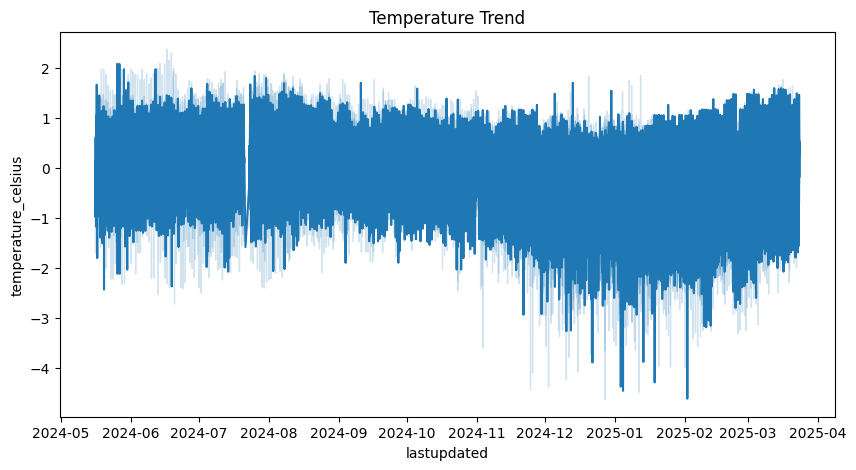

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

print("Generating temperature trend plot...")
plt.figure(figsize=(10,5))
sns.lineplot(data=df, x=df.index, y='temperature_celsius')
plt.title("Temperature Trend")
plt.show()


In [9]:
from statsmodels.tsa.arima.model import ARIMA

print("Training ARIMA model...")
model_arima = ARIMA(df['temperature_celsius'], order=(5,1,0))
model_arima_fit = model_arima.fit()
forecast_arima = model_arima_fit.forecast(steps=30)
print("ARIMA Forecast:")
print(forecast_arima)

Training ARIMA model...


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsm

ARIMA Forecast:
59808    0.319093
59809    0.259150
59810    0.304427
59811    0.218830
59812    0.268635
59813    0.250080
59814    0.279353
59815    0.259785
59816    0.268518
59817    0.253198
59818    0.264394
59819    0.260772
59820    0.266501
59821    0.261419
59822    0.263268
59823    0.260609
59824    0.263165
59825    0.262318
59826    0.263349
59827    0.262160
59828    0.262605
59829    0.262159
59830    0.262722
59831    0.262502
59832    0.262678
59833    0.262420
59834    0.262535
59835    0.262461
59836    0.262578
59837    0.262520
Name: predicted_mean, dtype: float64


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Training Prophet model...


DEBUG:cmdstanpy:input tempfile: /tmp/tmpvw81cd4b/29u9hi0f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvw81cd4b/4wv4_alm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66697', 'data', 'file=/tmp/tmpvw81cd4b/29u9hi0f.json', 'init=/tmp/tmpvw81cd4b/4wv4_alm.json', 'output', 'file=/tmp/tmpvw81cd4b/prophet_model3zdppcmg/prophet_model-20250324085913.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
08:59:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
08:59:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Prophet Forecast Plot:


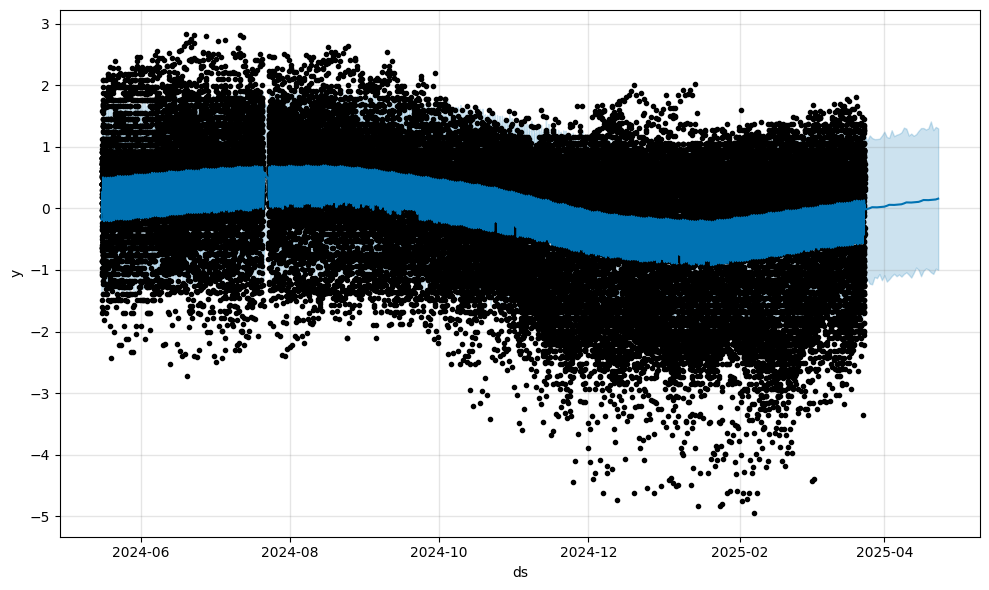

In [10]:
from prophet import Prophet

print("Training Prophet model...")
df_prophet = df[['temperature_celsius']].reset_index()
df_prophet.columns = ['ds', 'y']
model_prophet = Prophet()
model_prophet.fit(df_prophet)
future = model_prophet.make_future_dataframe(periods=30)
forecast_prophet = model_prophet.predict(future)
print("Prophet Forecast Plot:")
model_prophet.plot(forecast_prophet)
plt.show()


In [11]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

print("Training LSTM model...")

lookback = 30

X, y = [], []
temperature_values = df['temperature_celsius'].values

for i in range(len(temperature_values) - lookback):
    X.append(temperature_values[i:i+lookback])
    y.append(temperature_values[i+lookback])

X_train = np.array(X)
y_train = np.array(y)
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)

model_lstm = Sequential([
    LSTM(50, return_sequences=True, input_shape=(lookback, 1)),
    LSTM(50),
    Dense(1)
])

model_lstm.compile(optimizer='adam', loss='mse')

model_lstm.fit(X_train, y_train, epochs=10, batch_size=32)

print("LSTM Model Trained Successfully!")


Training LSTM model...
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1869/1869 ━━━━━━━━━━━━━━━━━━━━ 56s 28ms/step - loss: 0.8366
Epoch 2/10
1869/1869 ━━━━━━━━━━━━━━━━━━━━ 82s 28ms/step - loss: 0.6471
Epoch 3/10
1869/1869 ━━━━━━━━━━━━━━━━━━━━ 83s 29ms/step - loss: 0.4904
Epoch 4/10
1869/1869 ━━━━━━━━━━━━━━━━━━━━ 93s 34ms/step - loss: 0.3852
Epoch 5/10
1869/1869 ━━━━━━━━━━━━━━━━━━━━ 74s 30ms/step - loss: 0.3204
Epoch 6/10
1869/1869 ━━━━━━━━━━━━━━━━━━━━ 84s 31ms/step - loss: 0.2798
Epoch 7/10
1869/1869 ━━━━━━━━━━━━━━━━━━━━ 80s 30ms/step - loss: 0.2523
Epoch 8/10
1869/1869 ━━━━━━━━━━━━━━━━━━━━ 57s 31ms/step - loss: 0.2296
Epoch 9/10
1869/1869 ━━━━━━━━━━━━━━━━━━━━ 80s 30ms/step - loss: 0.2109
Epoch 10/10
1869/1869 ━━━━━━━━━━━━━━━━━━━━ 84s 31ms/step - loss: 0.1986
LSTM Model Trained Successfully!


In [12]:
X_train_2d = X_train.reshape(X_train.shape[0], -1)
X_train=X_train_2d
from xgboost import XGBRegressor
model_xgb = XGBRegressor()
model_xgb.fit(X_train_2d, y_train)
print("XGBoost Model Trained Successfully!")

XGBoost Model Trained Successfully!


Calculating feature importance using SHAP...


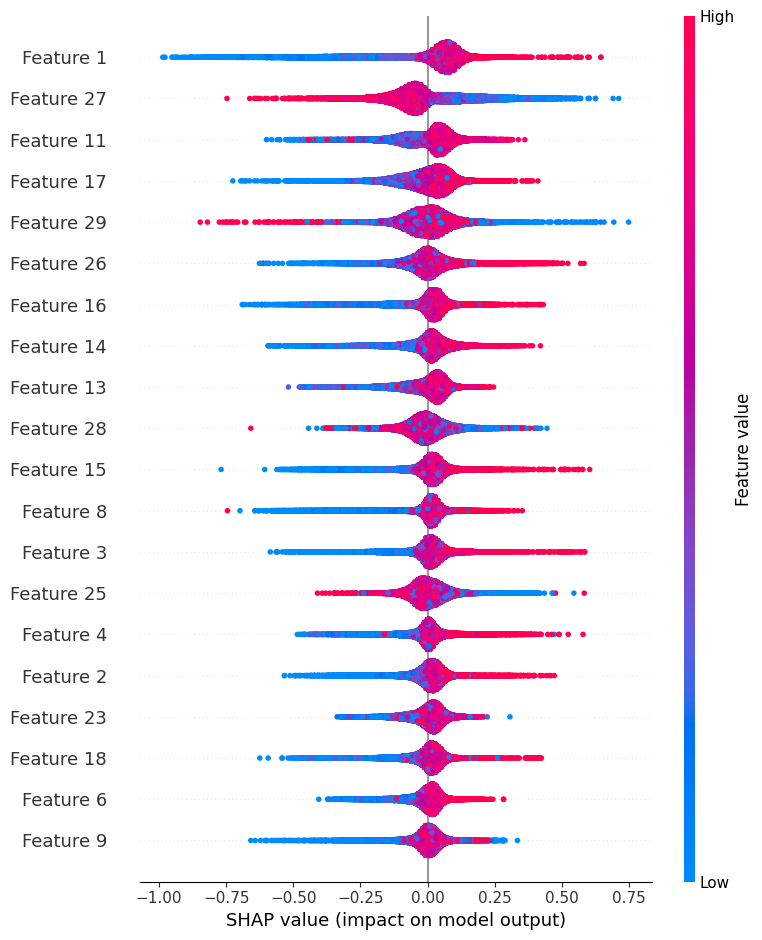

In [13]:
from shap import TreeExplainer, summary_plot

print("Calculating feature importance using SHAP...")
explainer = TreeExplainer(model_xgb)
shap_values = explainer.shap_values(X_train_2d)
summary_plot(shap_values, X_train_2d)


In [ ]:
import folium
from folium.plugins import HeatMap
from IPython.display import display

print("Generating geographical heatmap...")
map = folium.Map(location=[0, 0], zoom_start=2)

HeatMap(df[['latitude', 'longitude', 'temperature_celsius']].dropna().values.tolist()).add_to(map)

map.save("weather_heatmap.html")
print("Geographical heatmap saved as 'weather_heatmap.html'.")

display(map)

In [ ]:
from sklearn.cluster import KMeans

print("Applying K-Means clustering...")
kmeans = KMeans(n_clusters=5)
df['cluster'] = kmeans.fit_predict(df[['temperature_celsius', 'humidity']])
print("Clustering complete. Generating scatter plot...")
sns.scatterplot(data=df, x='temperature_celsius', y='humidity', hue='cluster', palette='viridis')
plt.title("Weather Clustering")
plt.show()


Displaying comprehensive analysis of Global Weather data...

MODEL EVALUATION

--- XGBoost Performance Metrics ---
Mean Squared Error: 0.1592
Root Mean Squared Error: 0.3990
Mean Absolute Error: 0.2918
R² Score: 0.8710
374/374 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step

--- LSTM Performance Metrics ---
Mean Squared Error: 0.1644
Root Mean Squared Error: 0.4055
Mean Absolute Error: 0.2895
R² Score: 0.8667

--- ARIMA Performance Metrics ---
Mean Squared Error: 0.7827
Root Mean Squared Error: 0.8847
Mean Absolute Error: 0.6625
R² Score: -0.0685

VISUALIZATION OF RESULTS


<Figure size 1200x600 with 0 Axes>

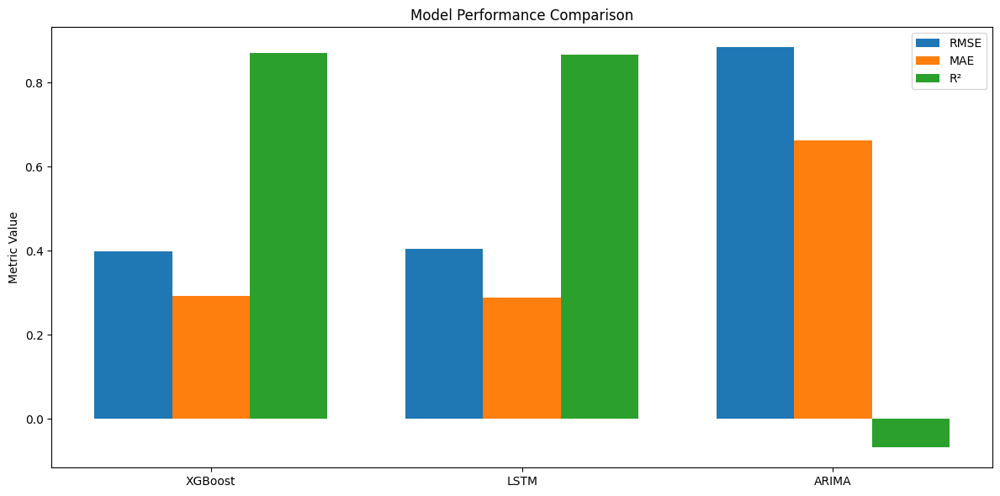

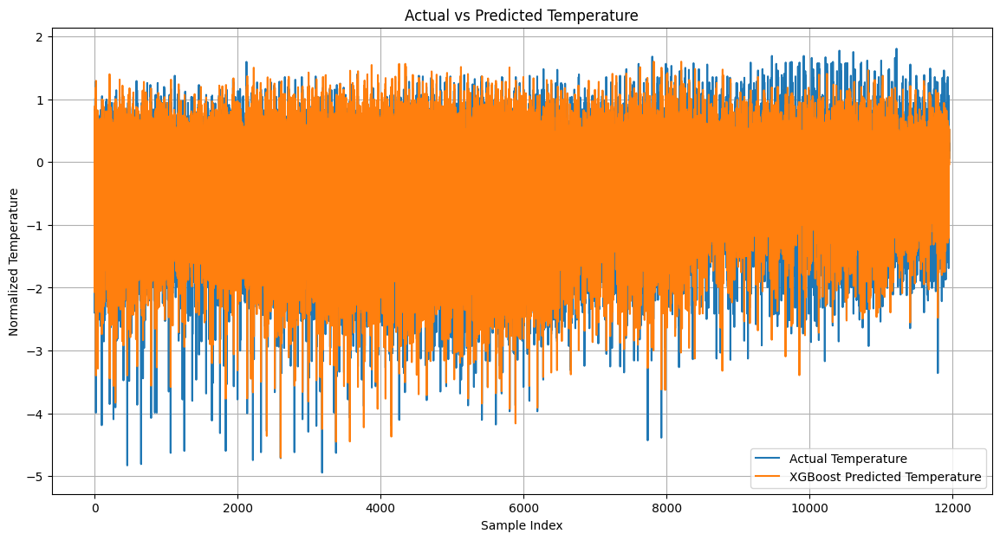

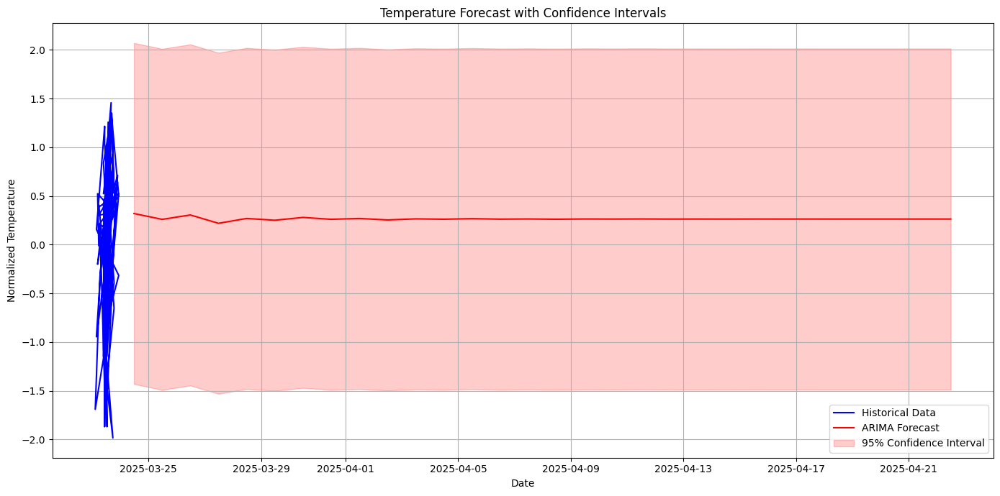


Displaying geographical temperature heatmap...


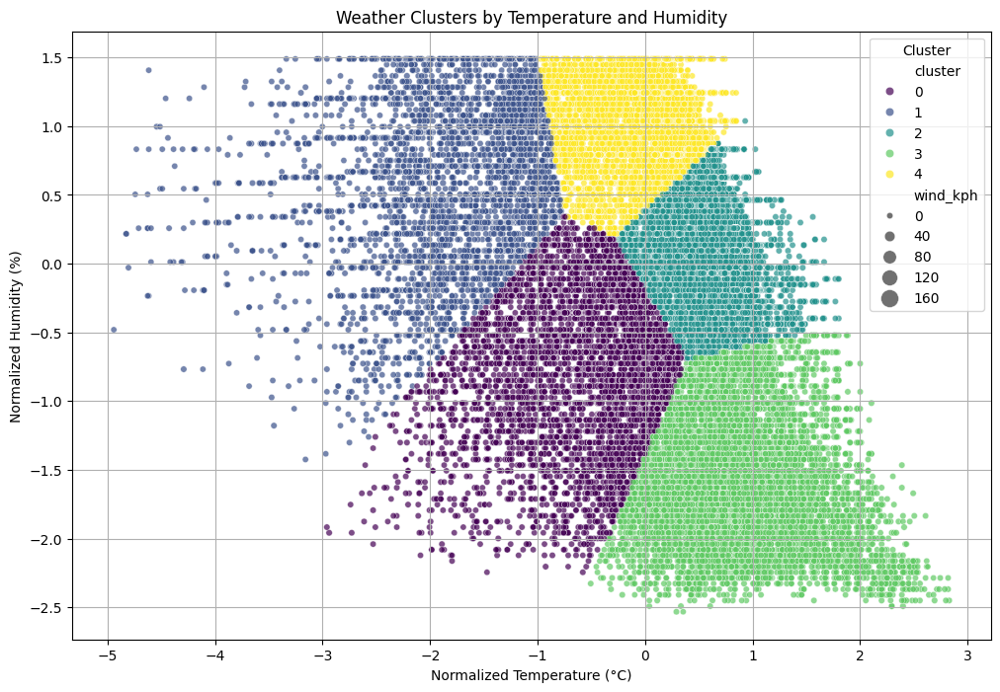

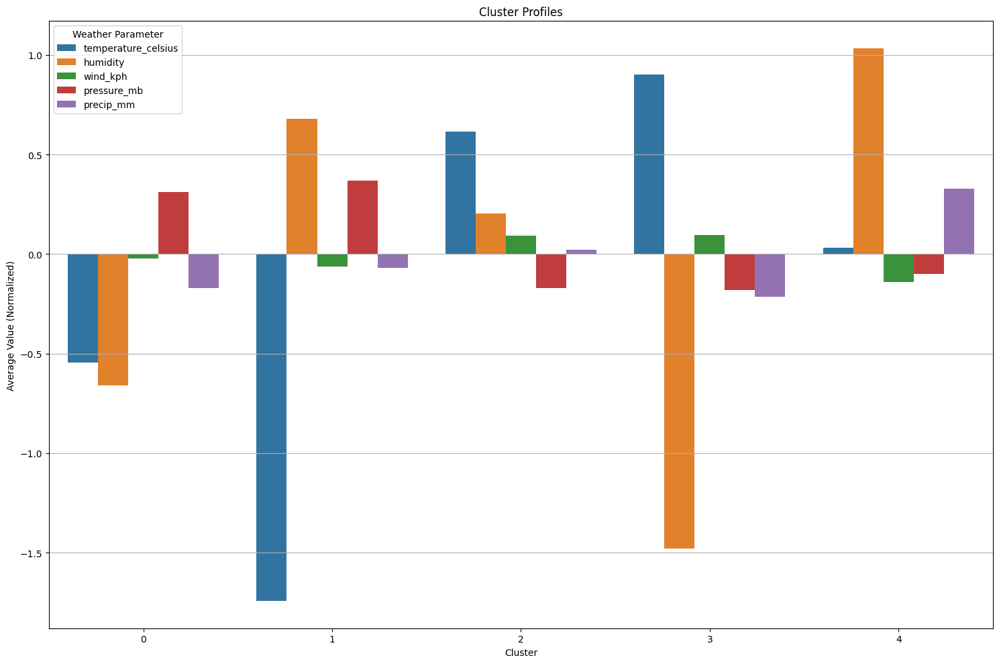

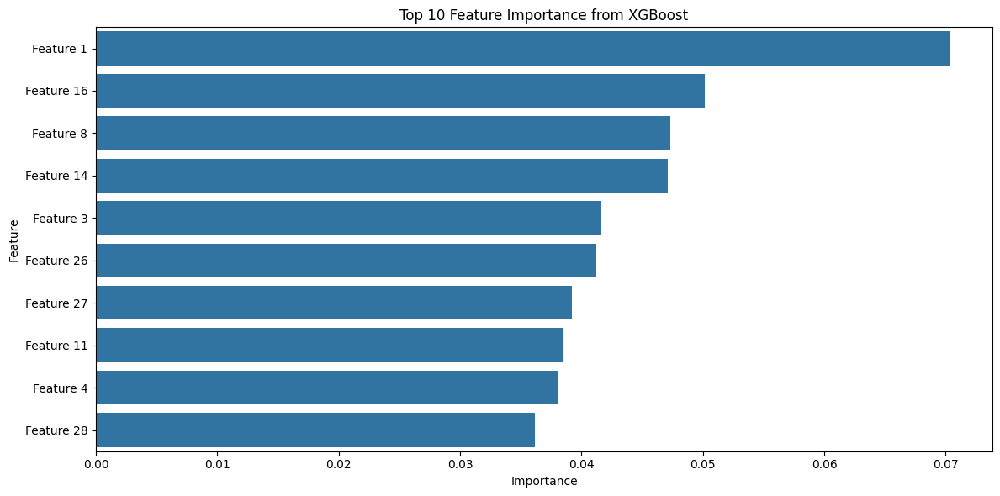

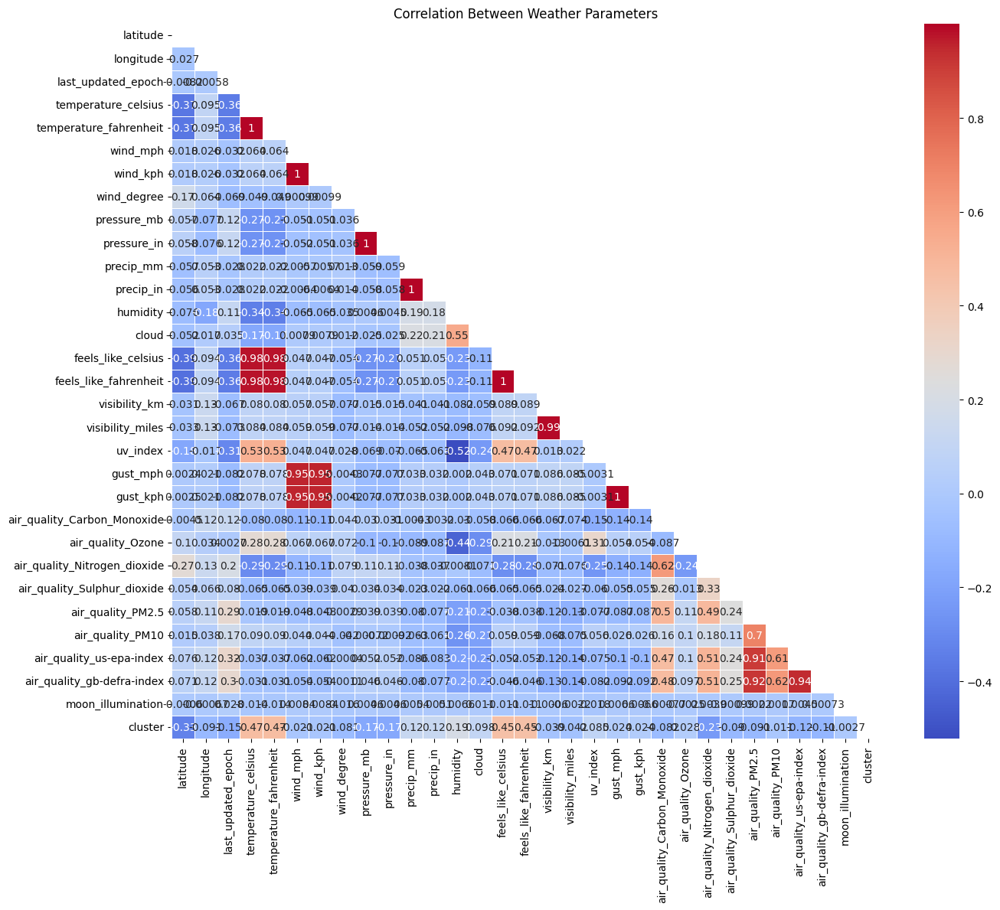

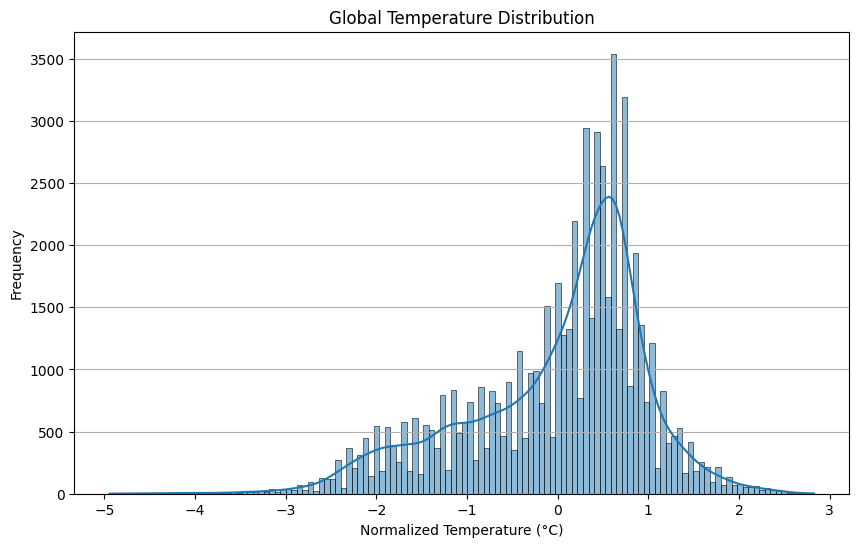


GENERATING INTERACTIVE DASHBOARD



Analysis complete! All visualizations and model evaluations have been displayed.


In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
import folium
from folium.plugins import HeatMap
from IPython.display import display, HTML
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Load the processed data (assuming the previous code has been run)
# If this is in a new session, you'll need to run the preprocessing code first
print("Displaying comprehensive analysis of Global Weather data...")

# Create a function to evaluate model performance
def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"\n--- {model_name} Performance Metrics ---")
    print(f"Mean Squared Error: {mse:.4f}")
    print(f"Root Mean Squared Error: {rmse:.4f}")
    print(f"Mean Absolute Error: {mae:.4f}")
    print(f"R² Score: {r2:.4f}")

    return mse, rmse, mae, r2

# 1. Evaluate all models on a test split
# First, prepare test data
test_size = 0.2
train_size = int(len(X_train) * (1 - test_size))
X_test = X_train[train_size:]
y_test = y_train[train_size:]
X_train_subset = X_train[:train_size]
y_train_subset = y_train[:train_size]

X_test_2d = X_test.reshape(X_test.shape[0], -1)
X_test_lstm = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

# Get predictions from all models
print("\n=============================================")
print("MODEL EVALUATION")
print("=============================================")

# XGBoost predictions
y_pred_xgb = model_xgb.predict(X_test_2d)
metrics_xgb = evaluate_model(y_test, y_pred_xgb, "XGBoost")

# LSTM predictions
y_pred_lstm = model_lstm.predict(X_test_lstm).flatten()
metrics_lstm = evaluate_model(y_test, y_pred_lstm, "LSTM")

# ARIMA predictions - For ARIMA, we'll use the last forecast points
# Note: This is simplified - ideally we'd evaluate on the same period
last_test_points = min(len(y_test), len(forecast_arima))
metrics_arima = evaluate_model(
    df['temperature_celsius'].values[-last_test_points:],
    forecast_arima[:last_test_points],
    "ARIMA"
)

# 2. Create a model comparison visualization
models = ['XGBoost', 'LSTM', 'ARIMA']
metrics_data = {
    'RMSE': [metrics_xgb[1], metrics_lstm[1], metrics_arima[1]],
    'MAE': [metrics_xgb[2], metrics_lstm[2], metrics_arima[2]],
    'R²': [metrics_xgb[3], metrics_lstm[3], metrics_arima[3]]
}

print("\n=============================================")
print("VISUALIZATION OF RESULTS")
print("=============================================")

# Model comparison bar chart
plt.figure(figsize=(12, 6))
x = np.arange(len(models))
width = 0.25

fig, ax = plt.subplots(figsize=(12, 6))
ax.bar(x - width, metrics_data['RMSE'], width, label='RMSE')
ax.bar(x, metrics_data['MAE'], width, label='MAE')
ax.bar(x + width, metrics_data['R²'], width, label='R²')

ax.set_ylabel('Metric Value')
ax.set_title('Model Performance Comparison')
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.legend()
plt.tight_layout()
plt.show()

# 3. Compare actual vs predicted temperatures for the best model (assuming XGBoost based on your code)
plt.figure(figsize=(14, 7))
plt.plot(y_test, label='Actual Temperature')
plt.plot(y_pred_xgb, label='XGBoost Predicted Temperature')
plt.title('Actual vs Predicted Temperature')
plt.xlabel('Sample Index')
plt.ylabel('Normalized Temperature')
plt.legend()
plt.grid(True)
plt.show()

# 4. Visualize temperature forecast with confidence intervals
plt.figure(figsize=(14, 7))

# Plot the historical data
plt.plot(df.index[-100:], df['temperature_celsius'][-100:], label='Historical Data', color='blue')

# Plot the forecasts with simple confidence intervals
forecast_index = pd.date_range(start=df.index[-1], periods=len(forecast_arima)+1)[1:]
plt.plot(forecast_index, forecast_arima, label='ARIMA Forecast', color='red')

# Add confidence intervals (approximation)
forecast_std = np.std(df['temperature_celsius'][-100:])
plt.fill_between(forecast_index,
                 forecast_arima - 1.96*forecast_std,
                 forecast_arima + 1.96*forecast_std,
                 color='red', alpha=0.2, label='95% Confidence Interval')

plt.title('Temperature Forecast with Confidence Intervals')
plt.xlabel('Date')
plt.ylabel('Normalized Temperature')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# 5. Display geographical heatmap
print("\nDisplaying geographical temperature heatmap...")
map_center = [df['latitude'].mean(), df['longitude'].mean()]
map = folium.Map(location=map_center, zoom_start=2)
HeatMap(df[['latitude', 'longitude', 'temperature_celsius']].values.tolist()).add_to(map)
display(map)

# 6. Visualize clustering results
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df, x='temperature_celsius', y='humidity', hue='cluster', palette='viridis', size='wind_kph', sizes=(20, 200), alpha=0.7)
plt.title('Weather Clusters by Temperature and Humidity')
plt.xlabel('Normalized Temperature (°C)')
plt.ylabel('Normalized Humidity (%)')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

# 7. Create a cluster profile analysis
cluster_profiles = df.groupby('cluster').agg({
    'temperature_celsius': 'mean',
    'humidity': 'mean',
    'wind_kph': 'mean',
    'pressure_mb': 'mean',
    'precip_mm': 'mean'
}).reset_index()

plt.figure(figsize=(15, 10))
cluster_profiles_melted = pd.melt(cluster_profiles, id_vars=['cluster'], var_name='Variable', value_name='Value')
sns.barplot(x='cluster', y='Value', hue='Variable', data=cluster_profiles_melted)
plt.title('Cluster Profiles')
plt.xlabel('Cluster')
plt.ylabel('Average Value (Normalized)')
plt.legend(title='Weather Parameter')
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

# 8. Feature importance from XGBoost
plt.figure(figsize=(12, 6))
feature_importance = model_xgb.feature_importances_
feature_names = [f'Feature {i}' for i in range(X_train_2d.shape[1])]
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})
importance_df = importance_df.sort_values('Importance', ascending=False).head(10)
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.title('Top 10 Feature Importance from XGBoost')
plt.tight_layout()
plt.show()

# 9. Correlation heatmap of numerical features
plt.figure(figsize=(14, 12))
numerical_cols = df.select_dtypes(include=[np.number]).columns
correlation = df[numerical_cols].corr()
mask = np.triu(correlation)
sns.heatmap(correlation, annot=True, cmap='coolwarm', linewidths=0.5, mask=mask)
plt.title('Correlation Between Weather Parameters')
plt.tight_layout()
plt.show()

# 10. Global temperature distribution
plt.figure(figsize=(10, 6))
sns.histplot(df['temperature_celsius'], kde=True)
plt.title('Global Temperature Distribution')
plt.xlabel('Normalized Temperature (°C)')
plt.ylabel('Frequency')
plt.grid(True, axis='y')
plt.show()

# Create a comprehensive dashboard
print("\n=============================================")
print("GENERATING INTERACTIVE DASHBOARD")
print("=============================================")

# Create an interactive dashboard using Plotly
dashboard = make_subplots(
    rows=3, cols=2,
    subplot_titles=(
        'Temperature Forecast',
        'Model Performance Comparison',
        'Temperature vs Humidity Clusters',
        'Feature Importance',
        'Global Temperature Distribution',
        'Correlation Between Key Parameters'
    ),
    specs=[
        [{"type": "scatter"}, {"type": "bar"}],
        [{"type": "scatter"}, {"type": "bar"}],
        [{"type": "histogram"}, {"type": "heatmap"}]
    ]
)

# 1. Temperature Forecast
dashboard.add_trace(
    go.Scatter(x=df.index[-50:], y=df['temperature_celsius'][-50:], name='Historical', line=dict(color='blue')),
    row=1, col=1
)
dashboard.add_trace(
    go.Scatter(x=forecast_index, y=forecast_arima, name='Forecast', line=dict(color='red')),
    row=1, col=1
)

# 2. Model Performance
dashboard.add_trace(
    go.Bar(x=models, y=metrics_data['RMSE'], name='RMSE'),
    row=1, col=2
)
dashboard.add_trace(
    go.Bar(x=models, y=metrics_data['MAE'], name='MAE'),
    row=1, col=2
)
dashboard.add_trace(
    go.Bar(x=models, y=metrics_data['R²'], name='R²'),
    row=1, col=2
)

# 3. Clusters
dashboard.add_trace(
    go.Scatter(
        x=df['temperature_celsius'],
        y=df['humidity'],
        mode='markers',
        marker=dict(
            size=8,
            color=df['cluster'],
            colorscale='Viridis',
            showscale=True
        ),
        text=df.index,
        name='Clusters'
    ),
    row=2, col=1
)

# 4. Feature Importance
dashboard.add_trace(
    go.Bar(
        y=importance_df['Feature'][:10],
        x=importance_df['Importance'][:10],
        orientation='h',
        name='Feature Importance'
    ),
    row=2, col=2
)

# 5. Temperature Distribution
dashboard.add_trace(
    go.Histogram(
        x=df['temperature_celsius'],
        nbinsx=30,
        name='Temperature Distribution'
    ),
    row=3, col=1
)

# 6. Correlation Heatmap (Simplified)
key_params = ['temperature_celsius', 'humidity', 'wind_kph', 'pressure_mb']
corr_subset = df[key_params].corr()

dashboard.add_trace(
    go.Heatmap(
        z=corr_subset.values,
        x=corr_subset.columns,
        y=corr_subset.columns,
        colorscale='RdBu',
        zmid=0
    ),
    row=3, col=2
)

# Update layout
dashboard.update_layout(
    height=1200,
    width=1000,
    title_text="Global Weather Analysis Dashboard",
    showlegend=False
)

dashboard.show()

print("\nAnalysis complete! All visualizations and model evaluations have been displayed.")